In [1]:
import pickle
import pandas as pd
import numpy as np
import warnings
import sys
import os
from skimage import io
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation, writers
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import matplotlib.image as mpimg
import glob
from PIL import Image
import seaborn as sns
from matplotlib import cm
from matplotlib.colors import ListedColormap
%matplotlib inline

warnings.simplefilter('ignore', pd.errors.DtypeWarning)
np.seterr(divide='ignore')
warnings.simplefilter("ignore")

sys.path.append('/sise/home/shakarch/muscle-formation-regeneration')
sys.path.append(os.path.abspath('..'))


import TimeSeriesAnalysis.analysis.calc_single_cell_properties as calcultator 
import TimeSeriesAnalysis.analysis.utils as utils
import TimeSeriesAnalysis.data_layer.utils as data_utils
import TimeSeriesAnalysis.configuration.consts as consts
import TimeSeriesAnalysis.configuration.params as params

In [2]:
scores_df_s3_fused = data_utils.get_scores_df_with_fusion()
scores_df_s3_fused

,score_motility,time,Spot frame,Spot track ID,score_intensity,fusion_frame,fusion_time,Spot position X,Spot position Y
0,NaN,0.000000,0.0,217.0,NaN,179.0,14.916667,725.925171,585.328003
2,NaN,0.083333,1.0,217.0,NaN,179.0,14.916667,729.656006,584.194153
4,NaN,0.166667,2.0,217.0,NaN,179.0,14.916667,734.618469,583.389587
6,NaN,0.250000,3.0,217.0,NaN,179.0,14.916667,740.805176,583.193176
8,NaN,0.333333,4.0,217.0,NaN,179.0,14.916667,746.627686,582.433533
...,...,...,...,...,...,...,...,...,...
30943,0.437790,17.666667,212.0,6401.0,0.707728,178.0,14.833333,1586.298462,621.301941
30944,0.242570,17.250000,207.0,6401.0,0.413052,178.0,14.833333,1594.594238,608.023071
30945,0.511072,14.833333,178.0,6401.0,0.329736,178.0,14.833333,1615.982788,511.990723
30946,NaN,11.333333,136.0,6401.0,NaN,178.0,14.833333,1687.343018,523.640625


In [3]:
video_tif_nuc = io.imread("/storage/users/assafzar/Muscle_Differentiation_AvinoamLab/data/videos/test/S3_nuclei.tif")

In [8]:
video_tif_actin = io.imread("/storage/users/assafzar/Muscle_Differentiation_AvinoamLab/data/videos/test/211212erki-p38-stiching_s3_EGFP_ORG.tif")

In [3]:
video_tif_merges = io.imread("/storage/users/assafzar/Muscle_Differentiation_AvinoamLab/data/videos/test/Merged_s3.tif")

In [11]:
# fusion_scores = fusion_scores[fusion_scores["Spot track ID"].isin([16348, 6405, 27879, 2764, 16348, 6208, 16991, 1394, 9241, 217, 1])]

In [11]:
# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

[('video_tif_actin', 2871146716),
 ('video_tif_nuc', 2871146716),
 ('scores_df_s3_fused', 1095056),
 ('ListedColormap', 1472),
 ('FuncAnimation', 1064),
 ('make_axes_locatable', 136),
 ('plot_single_cell_tracking', 136),
 ('Image', 72),
 ('animation', 72),
 ('calcultator', 72),
 ('cm', 72),
 ('consts', 72),
 ('data_utils', 72),
 ('mpimg', 72),
 ('mpl', 72),
 ('np', 72),
 ('params', 72),
 ('pd', 72),
 ('plt', 72),
 ('sns', 72),
 ('utils', 72),
 ('writers', 48)]

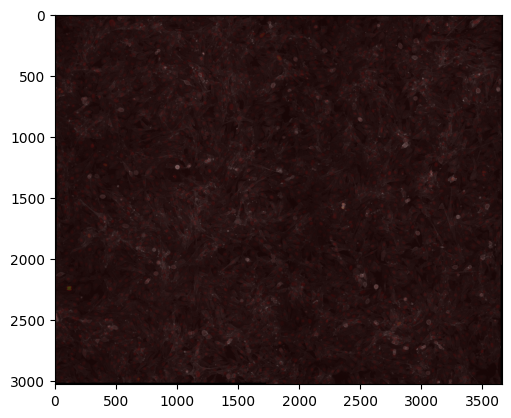

In [9]:
plt.imshow(video_tif_actin[80] , cmap="gray")
plt.imshow(video_tif_nuc[80] , cmap="hot", alpha=0.2)
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


ylim (2121.9582033363768, 961.8644681327787)
xlim (3001.650010146104, 3893.0397727272725)


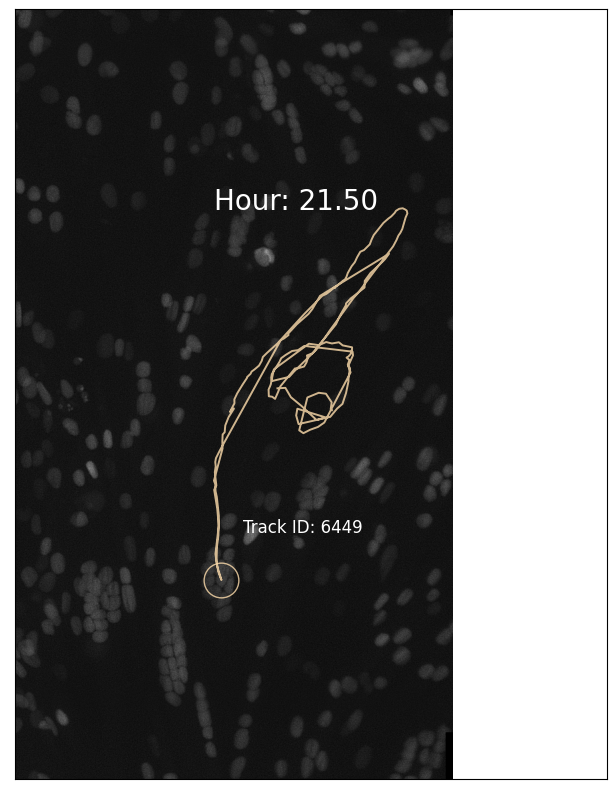

[6.4 4.8]


In [23]:
def plot_single_cell_tracking(track_data, path, nuc_video, frame):
    fig, ax = plt.subplots(figsize=(10, 10))
    div = make_axes_locatable(ax)
    window_size = 300
    track_data = track_data.drop_duplicates(subset=['Spot frame'])
    fusion_frame = track_data["fusion_frame"].min()
    x_val = (track_data["Spot position X"]) / 0.462
    y_val = (track_data["Spot position Y"]) / 0.462
    track_id = int((track_data["Spot track ID"]).iloc[0])
    
    hour_time = int(frame) * (1 / 12)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    frame_image_nuc = nuc_video[frame]#[int(y_val.min()):int(y_val.max()), int(x_val.min()):int(x_val.max())]
    ax.imshow(frame_image_nuc, cmap='gray',vmin=0, vmax=255)
    
    arg_frame = track_data.index[track_data['Spot frame'] == frame].tolist()[0]
    ax.plot(x_val[arg_frame], y_val[arg_frame], c="navajowhite",mfc='none', marker='o', markersize=25, linewidth=2.2, alpha=0.8) # circle
    ax.text(x_val[arg_frame] *1.01, y_val[arg_frame] * 0.96, f"Track ID: {track_id}", color='white', fontsize=12)
    ax.text(x_val.min(), y_val.min() + 2, "Hour: {hour:.2f}".format(hour=hour_time), fontsize=20, color="white")
    ax.plot(x_val[:210], y_val[:210], c="navajowhite", linewidth=1.4, alpha=0.8)

    ax.set_xlim(x_val.min() - window_size , x_val.max() + window_size)
    ax.set_ylim(y_val.min() - window_size , y_val.max() + window_size)
    ax.invert_yaxis()
    print("ylim",ax.get_ylim())
    print("xlim",ax.get_xlim())
    plt.savefig(path, format='eps')
    plt.show()
    print(plt.gcf().get_size_inches())
    plt.close()

# [27879, 4657, 16003, 16771]
track = scores_df_s3_fused[scores_df_s3_fused["Spot track ID"]==6449] 
plot_single_cell_tracking(track, consts.storage_path + "/eps_figs/single_cell_tracking_t=160_cellId=217.eps", video_tif_nuc, 258)

In [ ]:
cell_id= 16003
for i in [4.5, 6.5, 10.5, 14.16, 14.5, 18.5, 21.5]:
    track = scores_df_s3_fused[scores_df_s3_fused["Spot track ID"]==cell_id] #6993 
    print(i*12)
    plot_single_cell_tracking(track, consts.storage_path + f"/eps_figs/single_cell_tracking_t={i}_cellId={cell_id}.eps", video_tif_nuc, int(i * 12))
    

In [55]:
def plot_single_cell_diff_trajectory(track_data, ax, time, xlim=(2.5,22.5)):
    sns.lineplot(ax=ax, x=track_data["time"], y="score_intensity", data=track_data, label="actin intensity predictor", color="brown")
    sns.scatterplot(ax=ax, x=track_data["fusion_time"], y="score_intensity", data=track_data[(track_data["time"]==track_data["fusion_time"])], color="brown", s=90)
    sns.lineplot(ax=ax, x=track_data["time"], y="score_motility", data=track_data, label="motility predictor", color="orange")
    sns.scatterplot(ax=ax, x=track_data["fusion_time"], y="score_motility", data=track_data[(track_data["time"]==track_data["fusion_time"])], color="orange", s=90)
    ax.axhline(0.5, color='gray', linestyle='dashed')
    ax.axvline(time, color='gray', linestyle='dashed')
    ax.set_ylabel("differentiation state")
    ax.set_ylim((0,1))
    ax.set_xlim(xlim)
    ax.legend(loc='upper right')

In [56]:
def gif_single_cell_tracking_and_diff_trajectory(track_data, track_id, GifName, nuc_video, video_tif_actin=None, rolling_w=1):
#     nuc_video = np.array(nuc_video)
    files = glob.glob(consts.storage_path + f"single_cell_images/{track_id}/*.png")
    
    # cut track after fusion time
    fusion_frame = track_data["fusion_frame"].min()
    track_data = track_data[(track_data["Spot frame"] <= fusion_frame + 10) ]
    track_data = track_data.dropna(subset=["score_motility"])
    track_data["score_intensity"] = track_data["score_intensity"].rolling(rolling_w).mean()
    track_data["score_motility"] = track_data["score_motility"].rolling(rolling_w).mean()
    x_val = (track_data["Spot position X"]) / 0.462
    y_val = (track_data["Spot position Y"]) / 0.462
    window_size = 100
    min_frame, max_frame = track_data["Spot frame"].min(), track_data["Spot frame"].max()
    min_x, max_x, min_y, max_y = x_val.min() - window_size, x_val.max() + window_size, y_val.min() - window_size, y_val.max() + window_size
    colors = sns.light_palette("orange", n_colors=fusion_frame, reverse=False, as_cmap=False, input='rgb')
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 13), gridspec_kw={'height_ratios': [4,1], })
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    def animate(i):
#         print(i)
        # plot tracking using tiff
        ax1.cla()
        time = i * (1 / 12)
        color_by_time = colors[i] if i < fusion_frame else "mediumaquamarine"

#         frame_image_nuc = nuc_video[i]
#         ax1.imshow(frame_image_nuc, cmap='gray')
        if video_tif_actin is not None:
            frame_image_actin = video_tif_actin[i]
            frame_image_nuc = nuc_video[i]
            ax1.imshow(frame_image_nuc , cmap="Greys_r", alpha=1, vmin=0, vmax=frame_image_nuc.max()/2)  
            ax1.imshow(frame_image_actin , cmap="pink", alpha=0.5)  
        else:
            frame_image_nuc = nuc_video[i]
            ax1.imshow(frame_image_nuc, cmap='gray')
        
        arg_frame = track_data.index[track_data['Spot frame'] == i].tolist()[0]
        ax1.plot(x_val[arg_frame], y_val[arg_frame], c=color_by_time, mfc='none', marker='o', markersize=35, linewidth=2.5, alpha=0.8) # circle    
        ax1.plot(x_val, y_val, c="blanchedalmond", linewidth=1.1, alpha=0.5) # track line navajowhite

        ax1.text(x_val[arg_frame] * 1.01, y_val[arg_frame] * 0.98, f"Track ID: {track_id}", color=color_by_time, fontsize=12)
        ax1.text(min_x, min_y + 2, "Hour: {hour:.2f}".format(hour=time), fontsize=20, color=color_by_time)
        ax1.set_xlim(min_x , max_x)
        ax1.set_ylim(min_y , max_y)
        
#         # plot tracking images from mastodon
#         file_path = files[int(i)]
#         current_frame = int(file_path.split("/")[7].split("-")[1].split(".")[0])
#         img = mpimg.imread(file_path)
#         ax1.imshow(img)
#         ax1.get_xaxis().set_visible(False)
#         ax1.get_yaxis().set_visible(False)
        
        # plot differentiation trajectory
        ax2.cla()
        plot_single_cell_diff_trajectory(track_data, ax2, time)
    
    anim = FuncAnimation(fig, animate, frames=np.arange(min_frame, max_frame, dtype=int), interval=100)# len(files)
    writergif = animation.PillowWriter(fps=6)
    anim.save(GifName + ".gif", writer=writergif)
    plt.close()

In [57]:
for track_id in [16003]:# 16348, 6405, 27879, 2764, 6208, 16991, 1394, 9241]:
    print(track_id)
    track = scores_df_s3_fused[scores_df_s3_fused["Spot track ID"]==track_id]
    track = track.astype(float)
    tracks_by_frame = [group for _, group in track.groupby('Spot frame')]
    gif_single_cell_tracking_and_diff_trajectory(track, track_id, f"track_gif_{track_id}", video_tif_nuc)

16003


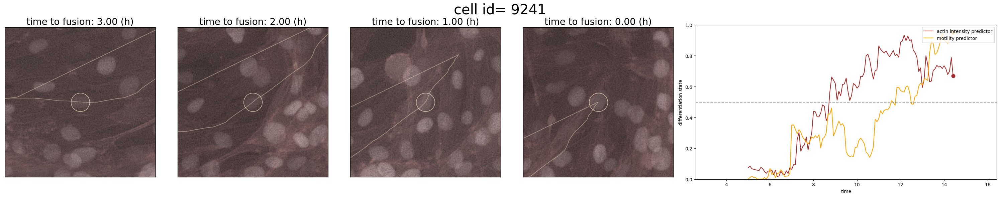

In [36]:
def tracks_behavior_before_fusion(track_data, GifName, nuc_video, video_tif_actin=None):
    track_data = track_data[(track_data["Spot frame"]<=track_data["fusion_frame"])]
    track_id = int((track_data["Spot track ID"]).iloc[0])

    fig, axes = plt.subplots(1, 5, figsize=(30, 6), gridspec_kw={'width_ratios': [1,1,1,1,2], 'height_ratios': [1]})    
    x_val = (track_data["Spot position X"]) / 0.462
    y_val = (track_data["Spot position Y"]) / 0.462
    fusion_frame = track_data["fusion_frame"].min()
    frames = [int(fusion_frame - x) for x in reversed(range(0,48,12))]
    window_size = 120
    min_frame, max_frame = track_data["Spot frame"].min(), track_data["Spot frame"].max()
    plot_single_cell_diff_trajectory(track_data, axes[4], time=0, xlim=(min_frame* (1 / 12), max_frame* (1 / 12) + 2))
    
    for ax, frame in zip(axes[:4], frames):
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        time = int(frame) * (1 / 12)
        time_before_fusion = fusion_frame * (1 / 12) -time
        
        if video_tif_actin is not None:
            try:
                frame_image_actin = video_tif_actin[frame]
                frame_image_nuc = nuc_video[frame]
                ax.imshow(frame_image_nuc , cmap="Greys_r", alpha=1, vmin=0, vmax=frame_image_nuc.max()/2)  
                ax.imshow(frame_image_actin , cmap="pink", alpha=0.5)  
            except:
                print("exception")
                break
        else:
            frame_image_nuc = nuc_video[frame]
            ax.imshow(frame_image_nuc, cmap='gray')
            
        arg_frame = track_data.index[track_data['Spot frame'] == frame].tolist()[0]
        ax.plot(x_val[arg_frame], y_val[arg_frame], c="blanchedalmond",mfc='none', marker='o', markersize=40, linewidth=2.2, alpha=0.8) # circle
        ax.plot(x_val[:120], y_val[:120], c="blanchedalmond", linewidth=1.1, alpha=0.5) # track's course
        ax.set_xlim(x_val[arg_frame] - window_size, x_val[arg_frame] + window_size)
        ax.set_ylim(y_val[arg_frame] - window_size, y_val[arg_frame] + window_size)
        ax.set_title("time to fusion: {hour:.2f} (h)".format(hour=time_before_fusion), fontsize=20)
        
    plt.suptitle(f"cell id= {track_id}", fontsize=30) 
    plt.tight_layout()
    plt.show()
track_id = 9241
track = fusion_scores[fusion_scores["Spot track ID"]==track_id]
track = track.astype(float)
tracks_by_frame = [group for _, group in track.groupby('Spot frame')] 
tracks_behavior_before_fusion(track, "myimage", video_tif_nuc, video_tif_actin)

16348


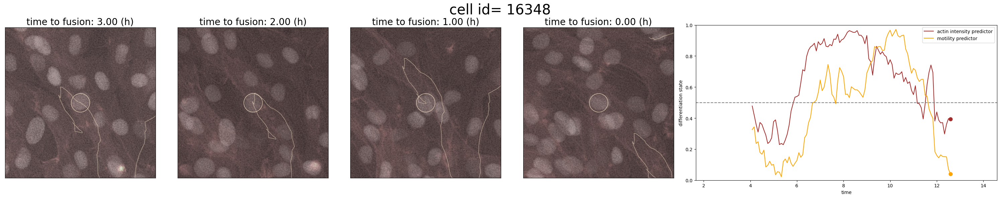

6405


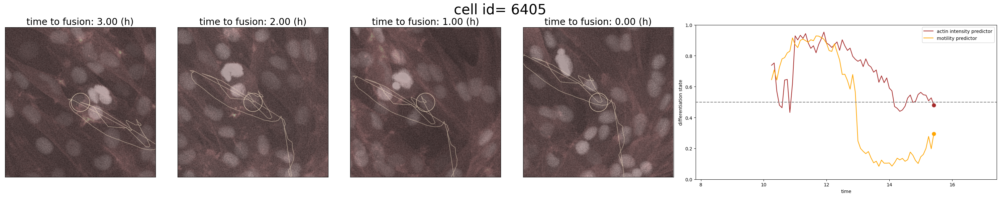

27879


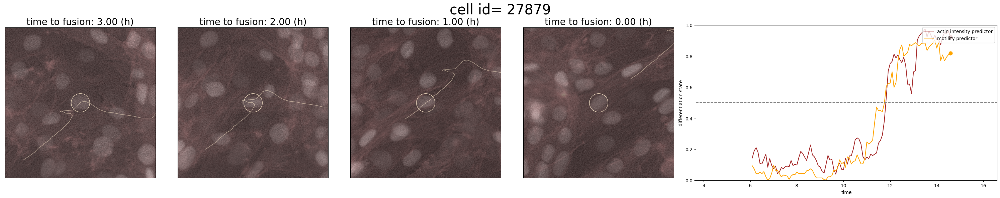

2764


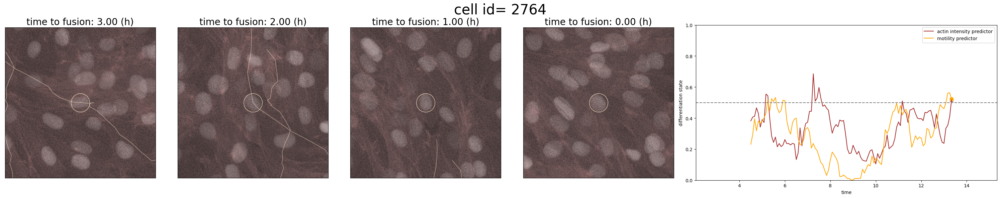

16348


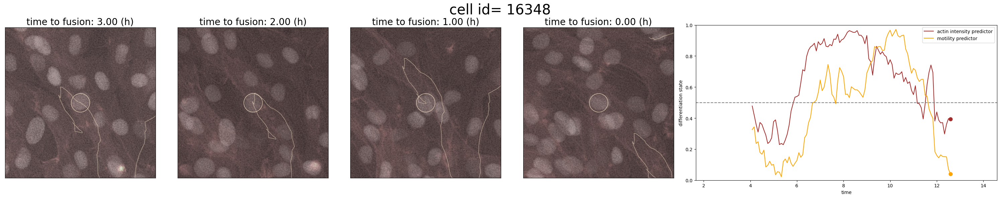

6208


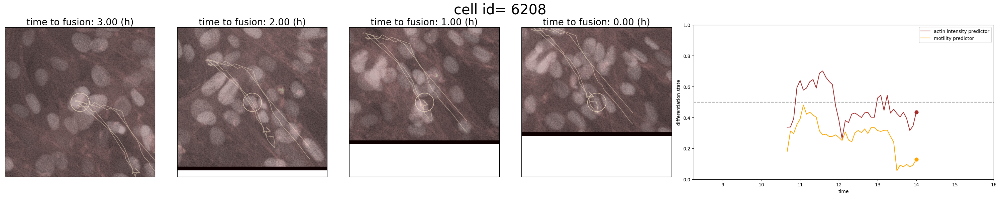

16991


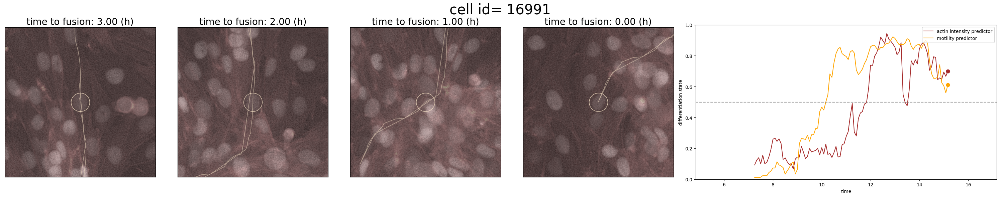

1394


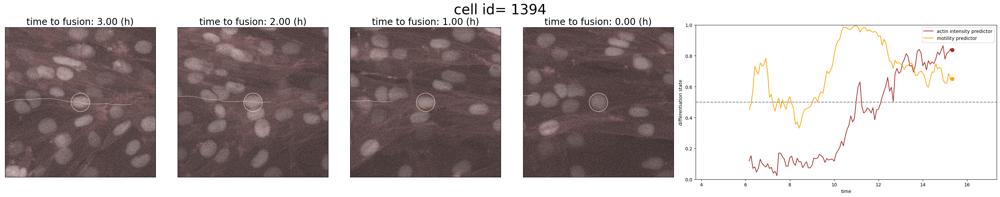

9241


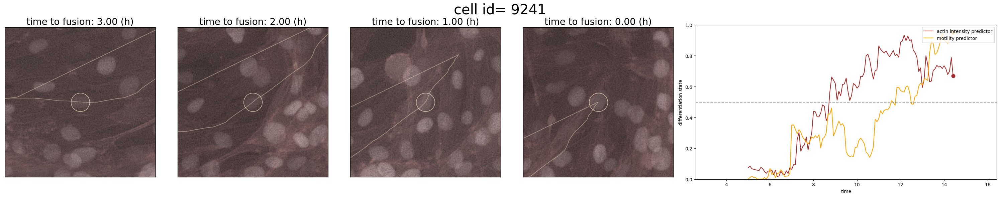

In [37]:
for track_id in [16348, 6405, 27879, 2764, 16348, 6208, 16991, 1394, 9241]:
    print(track_id)
    track = fusion_scores[fusion_scores["Spot track ID"]==track_id]
    track = track.astype(float)
    tracks_by_frame = [group for _, group in track.groupby('Spot frame')]
    tracks_behavior_before_fusion(track, "myimage", video_tif_nuc, video_tif_actin)